#Identifying Plant Diseases Using Distributed Deep Learning

##Introduction
This Jupyter Notebook explores a deep learning-based approach to classify plant diseases using images. The primary objective is to leverage convolutional neural networks (CNNs) to analyze plant leaf images and predict the type of infection or disease present. The dataset comprises images of plant leaves affected by various infections, and the task involves designing a robust classification pipeline that handles preprocessing, augmentation, model training, and evaluation.

In addition to conventional deep learning techniques, the notebook implements advanced methods such as distributed data parallelism to optimize training efficiency on GPUs. The goal is not only to achieve high accuracy but also to optimize computational resources effectively.

Key features of this notebook include:

Dataset exploration, preprocessing, and augmentation using libraries like PyTorch and Albumentations.
Implementation of ResNet-based architectures for image classification.
Parallel processing and distributed training for efficiency.
Visualization and interpretation of model performance.

In [ ]:
import os
import shutil
from glob import glob
import random
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import random_split, Dataset, DataLoader
from torchvision import transforms as T
from torchsummary import summary
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.utils import make_grid
from torchvision.datasets import ImageFolder
from time import time
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import albumentations as A
from albumentations.pytorch import ToTensorV2
import pycuda.driver as pcuda
import multiprocessing as mp
import warnings

In [ ]:
pcuda.init()
torch.manual_seed(2024)
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

In [ ]:
print("Pytorch: Current device is", torch.cuda.current_device())
print("Pcuda: Current active GPU is", pcuda.Device(0).name())

Pytorch: Current device is 0
Pcuda: Current active GPU is Tesla V100-SXM2-32GB


In [ ]:
# Define the data directory and augmentation directory
data_directory = os.path.join(os.getcwd(), "dataset", "data")
aug_directory = os.path.join(os.getcwd(), "aug")

In [ ]:
infection_classes = os.listdir(data_directory)
infection_classes

['Apple___alternaria_leaf_spot',
 'Apple___black_rot',
 'Apple___brown_spot',
 'Apple___gray_spot',
 'Apple___healthy',
 'Apple___rust',
 'Apple___scab',
 'Bell_pepper___bacterial_spot',
 'Bell_pepper___healthy',
 'Blueberry___healthy',
 'Cassava___bacterial_blight',
 'Cassava___brown_streak_disease',
 'Cassava___green_mottle',
 'Cassava___healthy',
 'Cassava___mosaic_disease',
 'Cherry___healthy',
 'Cherry___powdery_mildew',
 'Corn___common_rust',
 'Corn___gray_leaf_spot',
 'Corn___healthy',
 'Corn___northern_leaf_blight',
 'Grape___black_measles',
 'Grape___black_rot',
 'Grape___healthy',
 'Grape___isariopsis_leaf_spot',
 'Grape_leaf_blight',
 'Orange___citrus_greening',
 'Peach___bacterial_spot',
 'Peach___healthy',
 'Potato___bacterial_wilt',
 'Potato___early_blight',
 'Potato___healthy',
 'Potato___late_blight',
 'Potato___nematode',
 'Potato___pests',
 'Potato___phytophthora',
 'Potato___virus',
 'Raspberry___healthy',
 'Rice___bacterial_blight',
 'Rice___blast',
 'Rice___brown_s

In [ ]:
print("Number of infection classes in dataset: {}".format(len(infection_classes)))

Number of infection classes in dataset: 61


In [ ]:
def get_unique_info(info_type):
    if info_type == "plants":
        plants = []
        for plant in infection_classes:
            if plant.split('___')[0] not in plants:
                plants.append(plant.split('___')[0])
        return plants

    if info_type == "infection_classes":
        infection_classes
        number_of_infection_classes = 0
        for plant in infection_classes:
            if plant.split('___')[0] != 'healthy':
                number_of_infection_classes += 1
        return number_of_infection_classes

In [ ]:
# unique plants in the dataset
print("List of unique plants in the dataset:")
get_unique_info("plants")

List of unique plants in the dataset:


['Apple',
 'Bell_pepper',
 'Blueberry',
 'Cassava',
 'Cherry',
 'Corn',
 'Grape',
 'Grape_leaf_blight',
 'Orange',
 'Peach',
 'Potato',
 'Raspberry',
 'Rice',
 'Soybean',
 'Squash',
 'Strawberry',
 'Sugercane',
 'Tomato']

In [ ]:
print("Number of unique plants:", len(get_unique_info("plants")))

Number of unique plants: 18


In [ ]:
print("Number of unique infection classes: ", get_unique_info("infection_classes"))

Number of unique infection classes:  61


In [ ]:
class BotanyDataset(Dataset):
    def __init__(self, roots, has_aug_directory = False, transformations = None):
        self.transformations = transformations
        self.class_names = {}
        self.class_counts = {}
        count = 0

        # Determine which directories to include based on `has_aug_directory`
        if has_aug_directory:
            # Include all roots since roots contains data_directory and aug_directory
            included_roots = roots
        else:
            # Only include the root directory
            included_roots = [roots]

        self.image_paths = []
        temp_path = []

        for root in included_roots:
            temp_path = sorted(glob(f"{root}/*/*"))
            for _ , image_path in enumerate(temp_path):
                class_name = self.get_classname(image_path)
                if class_name not in self.class_names:
                    self.class_names[class_name] = count
                    self.class_counts[class_name] = 1
                    count += 1
                else:
                    self.class_counts[class_name] += 1
            self.image_paths.extend(temp_path)

    def get_classname(self, path):
        return os.path.dirname(path).split("/")[-1]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert("RGB")
        ground_truth = self.class_names[self.get_classname(image_path)]

        if self.transformations is not None:
            image = self.transformations(image)

        return image, ground_truth

In [ ]:
def get_dls(root, aug_root, has_aug_directory = False, transformations = None, batch_size = None, split = [0.9, 0.05, 0.05], workers = 4):
    # Create dataset with original and augmented directories
    ds = BotanyDataset(
        roots = [root, aug_root],
        has_aug_directory = has_aug_directory,
        transformations = transformations
    )

    # Calculate the lengths of respective sets
    dataset_length = len(ds)
    train_dataset_length = int(dataset_length * split[0])
    validation_dataset_length = int(dataset_length * split[1])
    test_dataset_length = dataset_length - (train_dataset_length + validation_dataset_length)

    print("length of dataset:", dataset_length)
    print("length of training_data:", train_dataset_length)
    print("length of validation_data:", validation_dataset_length)
    print("length of testing_data:", test_dataset_length)

    # Split the dataset
    train_dataset, validation_dataset, test_dataset = random_split(dataset = ds, lengths = [train_dataset_length, validation_dataset_length, test_dataset_length])

    # Create DataLoaders for respective sets
    train_dataloader  = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, num_workers = workers)
    validation_dataloader = DataLoader(validation_dataset, batch_size = batch_size, shuffle = False, num_workers = workers)
    test_dataloader  = DataLoader(test_dataset, batch_size = 1, shuffle = False, num_workers = workers)

    return train_dataloader, validation_dataloader, test_dataloader, ds.class_names

In [ ]:
# Defining the image size, mean, and standard deviation for normalizing
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
im_size = 224

# Defining the transformation function to apply on images
tfs = T.Compose([
    T.Resize((im_size, im_size)),
    T.ToTensor(),
    T.Normalize(mean = mean, std = std)
])

In [ ]:
# Check class imbalance
def check_class_imbalance(roots, has_aug_directory = False, transformations = None):
    ds = BotanyDataset(
        roots = roots,
        has_aug_directory = has_aug_directory,
        transformations = transformations
    )

    class_counts = ds.class_counts
    width = 0.7
    text_width = 0.05
    text_height = 2

    class_names = list(class_counts.keys())
    counts = list(class_counts.values())

    fig, ax = plt.subplots(figsize = (30, 10))
    indices = np.arange(len(counts))

    ax.bar(indices, counts, width, color = "darkturquoise")
    ax.set_xlabel("Classes", color = "black", fontsize=25)
    ax.set_xticklabels(class_names, rotation = 90)
    ax.set(xticks = indices, xticklabels = class_names)
    ax.set_ylabel("Samples in each class", color = "black", fontsize=25)
    ax.set_title("Botany Class Imbalance Analysis")

    for i, v in enumerate(counts):
        ax.text(i - text_width, v + text_height, str(v), color = "royalblue")

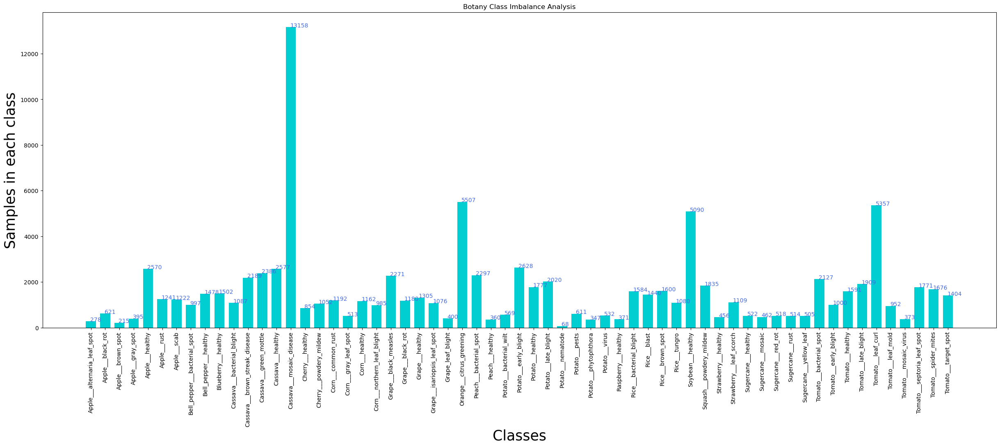

In [ ]:
check_class_imbalance(roots = data_directory, has_aug_directory=False, transformations = tfs)

In [ ]:
def augment_class(class_dir, aug_directory, class_limiter, augmentations):
    class_name = os.path.basename(class_dir)
    image_paths = glob(os.path.join(class_dir, '*.JPG')) + glob(os.path.join(class_dir, '*.PNG'))

    # Check if this is a minority class
    if len(image_paths) < class_limiter:
        print(f"Augmenting images for minority class: {class_name}")

        # Create augmentation directory for this class
        aug_class_directory = os.path.join(aug_directory, class_name)
        os.makedirs(aug_class_directory, exist_ok=True)

        # Loop through images and apply augmentations
        for i, image_path in enumerate(image_paths):
            image = Image.open(image_path)
            augmented = augmentations(image=np.array(image))['image']

            # Save augmented image
            aug_image_path = os.path.join(aug_class_directory, f"aug_{i}.jpg")
            aug_img = Image.fromarray(augmented.byte().permute(1, 2, 0).numpy())

            # Convert image to RGB mode before saving as JPEG
            aug_img = aug_img.convert('RGB')
            aug_img.save(aug_image_path)
    else:
        print(f"Skipping class: {class_name} (not a minority class)")

In [ ]:
def augment_dataset(num_cpus):
    # Number of samples
    class_limiter = 500

    global data_directory, aug_directory

    # start with an empty aug directory
    if os.path.isdir(aug_directory):
        shutil.rmtree(aug_directory)

    # Create list of class directories
    class_directories = [f.path for f in os.scandir(data_directory) if f.is_dir()]

    # Define augmentation transforms
    augmentations = A.Compose([
        A.RandomRotate90(p=0.5),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.RandomGamma(p=0.5),
        ToTensorV2()
    ])

    # Create a pool of worker processes
    pool = mp.Pool(processes=num_cpus)

    # Record start time
    start_time = time()

    # Parallelize the augmentation process for each class
    results = [pool.apply_async(augment_class, args=(class_dir, aug_directory, class_limiter, augmentations)) for class_dir in class_directories]

    # Wait for all processes to complete
    [r.get() for r in results]

    # Record end time
    end_time = time()
    elapsed_time = end_time - start_time

    pool.close()
    pool.join()

    return elapsed_time

In [ ]:
num_cpus = [1, 4, 8]
labels = ['1 CPU', '4 CPUs', '8 CPUs']
elapsed_time_list = []
speedup = []

In [ ]:
for _cpu in num_cpus:
    elapsed_time_list.append(augment_dataset(_cpu))

serial_wall_clock = elapsed_time_list[0]
for _time in elapsed_time_list:
    speedup.append(serial_wall_clock / _time)

Augmenting images for minority class: Apple___alternaria_leaf_spot
Skipping class: Apple___black_rot (not a minority class)
Augmenting images for minority class: Apple___brown_spot
Augmenting images for minority class: Apple___gray_spot
Skipping class: Apple___healthy (not a minority class)
Skipping class: Apple___rust (not a minority class)
Skipping class: Apple___scab (not a minority class)
Skipping class: Bell_pepper___bacterial_spot (not a minority class)
Skipping class: Bell_pepper___healthy (not a minority class)
Skipping class: Blueberry___healthy (not a minority class)
Augmenting images for minority class: Cassava___bacterial_blight
Augmenting images for minority class: Cassava___brown_streak_disease
Augmenting images for minority class: Cassava___green_mottle
Augmenting images for minority class: Cassava___healthy
Augmenting images for minority class: Cassava___mosaic_disease
Skipping class: Cherry___healthy (not a minority class)
Skipping class: Cherry___powdery_mildew (not a

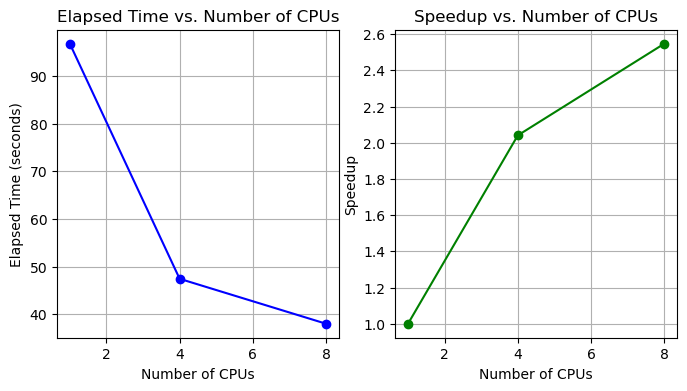

In [ ]:
plt.figure(figsize=(8, 4))

# Plot graph for elapsed time against number of CPU
plt.subplot(1, 2, 1)
plt.plot(num_cpus, elapsed_time_list, marker='o', color='blue', linestyle='-')
plt.xlabel('Number of CPUs')
plt.ylabel('Elapsed Time (seconds)')
plt.title('Elapsed Time vs. Number of CPUs')
plt.grid(True)

# Plot graph for speedup vs number of CPU
plt.subplot(1, 2, 2)
plt.plot(num_cpus, speedup, marker='o', color='green', linestyle='-')
plt.xlabel('Number of CPUs')
plt.ylabel('Speedup')
plt.title('Speedup vs. Number of CPUs')
plt.grid(True)
plt.show()
plt.close()

plt.show()
plt.close()

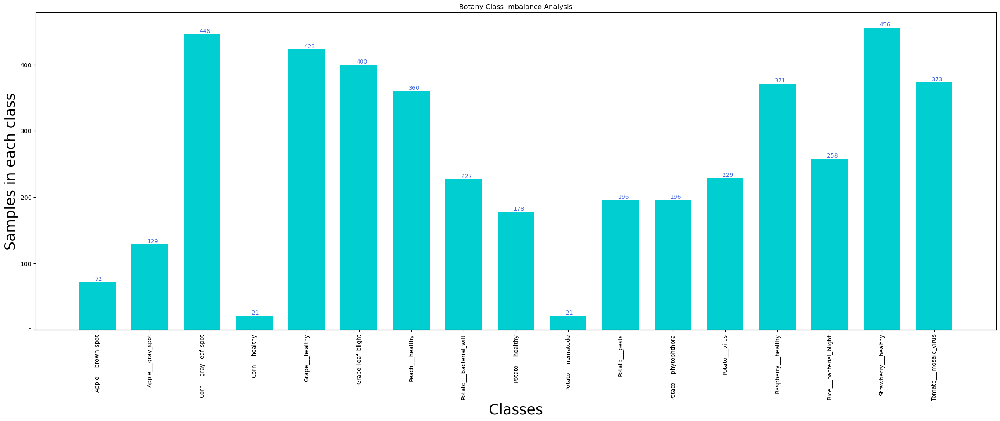

In [ ]:
check_class_imbalance(roots = aug_directory, has_aug_directory=False, transformations = tfs)

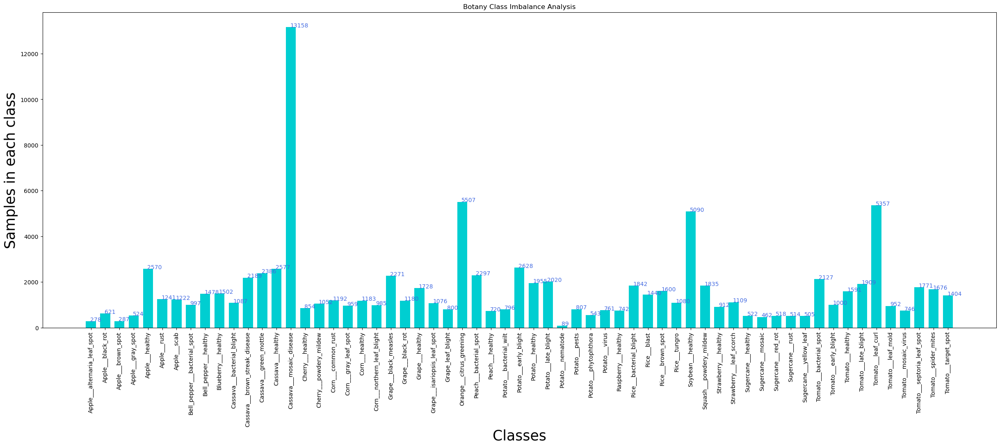

In [ ]:
check_class_imbalance(roots = [data_directory, aug_directory], has_aug_directory = True, transformations = tfs)

In [ ]:
train_dataloader, validation_dataloader, test_dataloader, classes = get_dls(
    root = data_directory,
    aug_root = aug_directory,
    has_aug_directory = True,
    transformations = tfs,
    batch_size = 32
)

print("Number of samples in training data: ", len(train_dataloader))
print("Number of samples in validation data: ", len(validation_dataloader))
print("Number of samples in testing data: ", len(test_dataloader))

length of dataset: 100224
length of training_data: 90201
length of validation_data: 5011
length of testing_data: 5012
Number of samples in training data:  2819
Number of samples in validation data:  157
Number of samples in testing data:  5012


In [ ]:
for key, value in classes.items():
    # key = str(key).split("data\\")[1]
    print(key, ':', value)

Apple___alternaria_leaf_spot : 0
Apple___black_rot : 1
Apple___brown_spot : 2
Apple___gray_spot : 3
Apple___healthy : 4
Apple___rust : 5
Apple___scab : 6
Bell_pepper___bacterial_spot : 7
Bell_pepper___healthy : 8
Blueberry___healthy : 9
Cassava___bacterial_blight : 10
Cassava___brown_streak_disease : 11
Cassava___green_mottle : 12
Cassava___healthy : 13
Cassava___mosaic_disease : 14
Cherry___healthy : 15
Cherry___powdery_mildew : 16
Corn___common_rust : 17
Corn___gray_leaf_spot : 18
Corn___healthy : 19
Corn___northern_leaf_blight : 20
Grape___black_measles : 21
Grape___black_rot : 22
Grape___healthy : 23
Grape___isariopsis_leaf_spot : 24
Grape_leaf_blight : 25
Orange___citrus_greening : 26
Peach___bacterial_spot : 27
Peach___healthy : 28
Potato___bacterial_wilt : 29
Potato___early_blight : 30
Potato___healthy : 31
Potato___late_blight : 32
Potato___nematode : 33
Potato___pests : 34
Potato___phytophthora : 35
Potato___virus : 36
Raspberry___healthy : 37
Rice___bacterial_blight : 38
Rice

In [ ]:
def tensor_2_image(args):
    t, t_type = args
    gray_transformation = T.Compose(
        [T.Normalize(mean = [ 0.], std = [1/0.5]), T.Normalize(mean = [-0.5], std = [1])]
    )

    rgb_transformation = T.Compose([
        T.Normalize(mean = [ 0., 0., 0. ], std = [ 1/0.229, 1/0.224, 1/0.225 ]),
        T.Normalize(mean = [ -0.485, -0.456, -0.406 ], std = [ 1., 1., 1. ])
    ])

    invTrans = gray_transformation if t_type == "gray" else rgb_transformation

    return (invTrans(t) * 255).detach().squeeze().cpu().permute(1,2,0).numpy().astype(np.uint8) \
        if t_type == "gray" \
        else (invTrans(t) * 255).detach().cpu().permute(1,2,0).numpy().astype(np.uint8)

In [ ]:
cpu_list = [1, 4, 8]
elapsed_time_lists = []
speedup_lists = []
graph_dict = {}
_temp_image_count = 0
_count = 1
tensor_list_copy = None

In [ ]:
def init_graph_dict():
    global graph_dict, _temp_image_count

    _temp_image_count = 1
    graph_dict[_temp_image_count] = {
        'elapsed' : [],
        'speedup' : []
    }

In [ ]:
def t2m_parallel(tensor_list, t_type):
    global elapsed_time_lists, speedup_lists, tensor_list_copy, graph_dict, _temp_image_count
    tensor_list_copy = tensor_list
    pools = [mp.Pool(processes=num_cpu) for num_cpu in cpu_list]
    results = []
    elapsed_time_lists = []

    # Loop through each CPU configuration
    for pool in pools:
        # Record start time
        start_time = time()
        tensor_images = pool.map(tensor_2_image, [(t, t_type) for t in tensor_list])
        pool.close()
        pool.join()

        # Record end time
        end_time = time()
        elapsed_time = end_time - start_time
        elapsed_time_lists.append(elapsed_time)
        graph_dict[_temp_image_count]['elapsed'].append(elapsed_time)

        # Add the tensor images to the results list
        results.extend(tensor_images)

    # Calculate speedups
    serial_wall_clock = elapsed_time_lists[0]
    graph_dict[_temp_image_count]['speedup'].extend([serial_wall_clock / _time for _time in elapsed_time_lists])

    return results

In [ ]:
def visualize(data, n_images, rows, cmap=None, class_names=None):
    global _temp_image_count, _count
    _count = 1
    assert cmap in ["rgb", "gray"], "The provided image must be either Black&White or color!"

    if cmap == "rgb":
        cmap = "viridis"

    if _temp_image_count == 0 or _temp_image_count > 19:
        init_graph_dict()

    plt.figure(figsize=(20, 10))
    indices = [random.randint(0, len(data) - 1) for _ in range(n_images)]

    for idx, _index in enumerate(indices):
        image, ground_truth = data[_index]
        tensor_image = t2m_parallel([image], cmap)[0]  # Get the first (and only) tensor image
        _temp_image_count += 1
        graph_dict[_temp_image_count] = {
            'elapsed' : [],
            'speedup' : []
        }

        # Start plot
        plt.subplot(rows, n_images // rows, idx + 1)
        plt.imshow(tensor_image, cmap=cmap)
        plt.axis('off')
        _count += 1

        if class_names is not None:
            plt.title(f"Class -> {class_names[int(ground_truth)]}")
        else:
            plt.title(f"Class -> {ground_truth}")

In [ ]:
def plot_performance():
    global cpu_list, graph_dict, _count

    for i in range(1, _count):
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.plot(cpu_list, graph_dict[i]['elapsed'], marker='o', color='blue', linestyle='-')
        plt.title(f'Elapsed Time Graph for Class {i}')
        plt.xlabel('Number of CPUs')
        plt.ylabel('Elapsed Time')
        plt.grid(True)

        # Plot speedup graphs
        plt.subplot(1, 2, 2)
        plt.plot(cpu_list, graph_dict[i]['speedup'], marker='o', color='green', linestyle='-')
        plt.title(f'Speedup Graph for Class {i}')
        plt.xlabel('Number of CPUs')
        plt.ylabel('Speedup')
        plt.grid(True)
        plt.tight_layout()

    plt.show()
    plt.close()

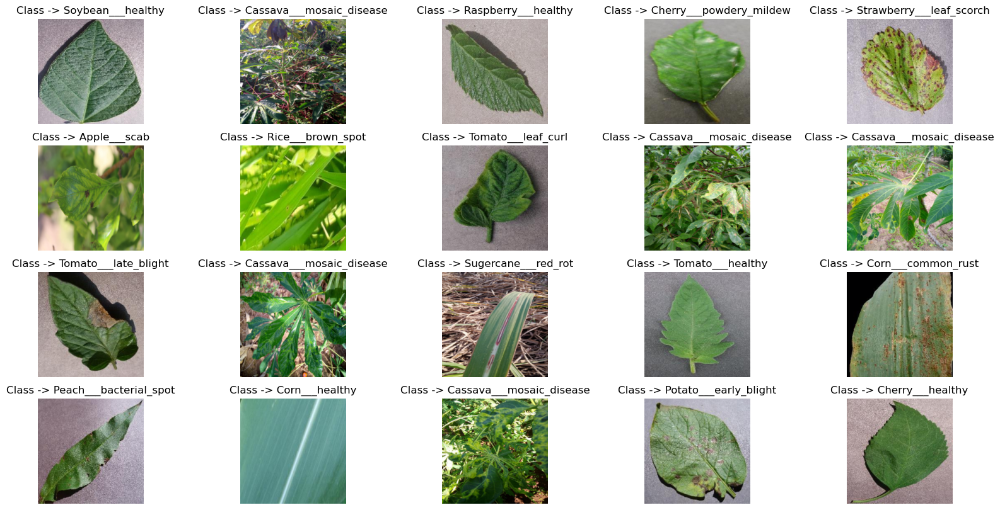

In [ ]:
visualize(train_dataloader.dataset, 20, 4, "rgb", list(classes.keys()))

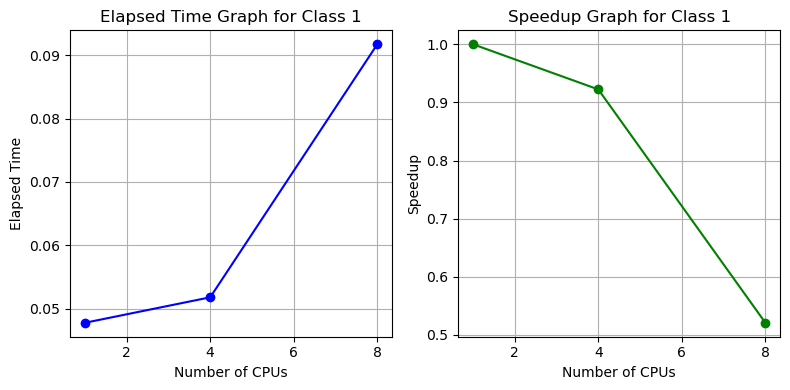

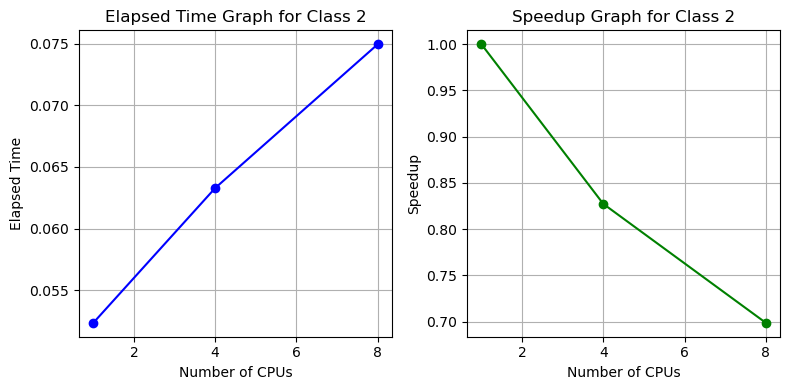

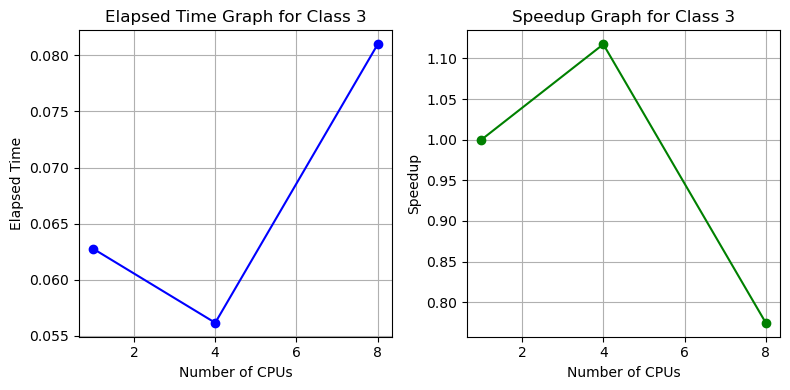

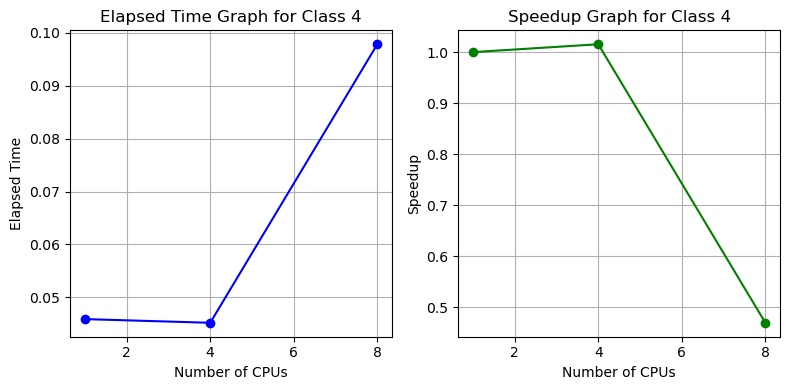

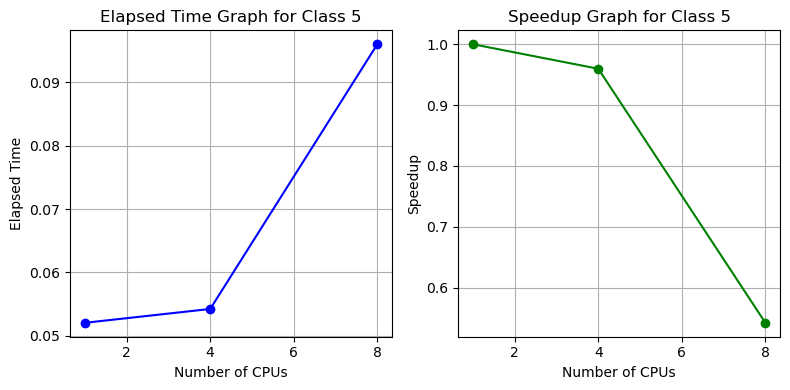

...

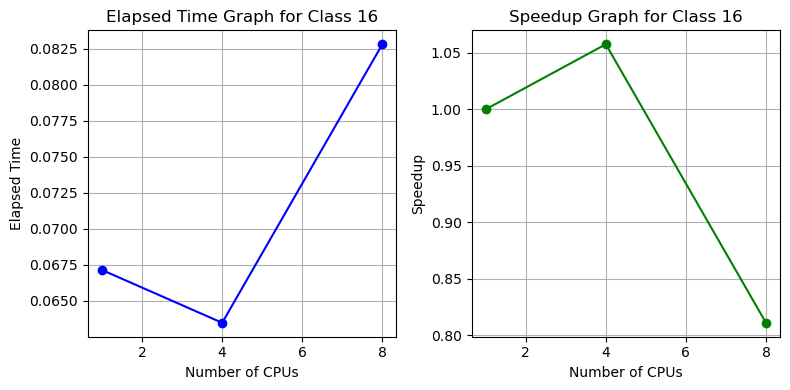

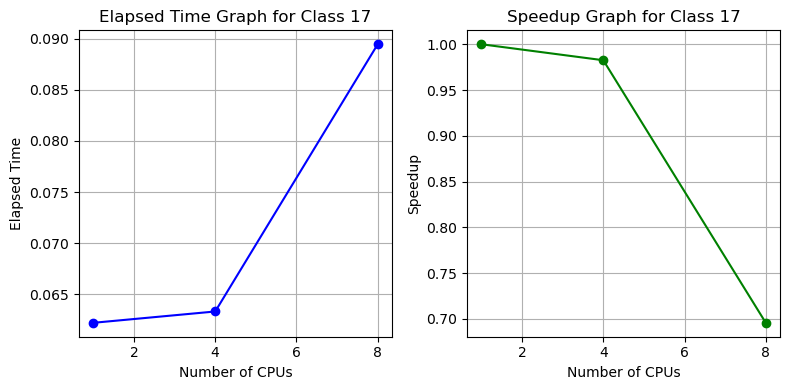

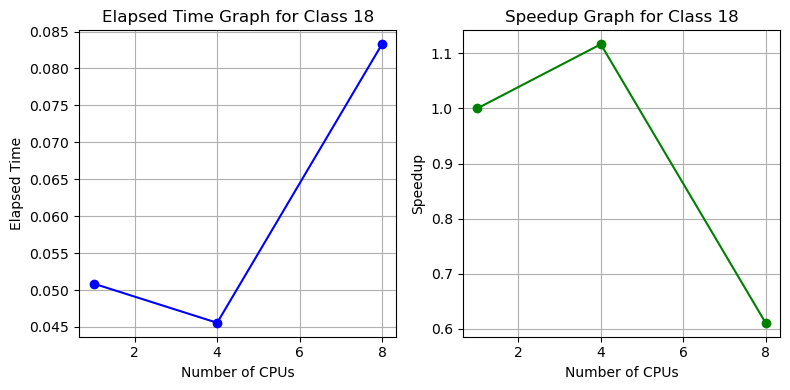

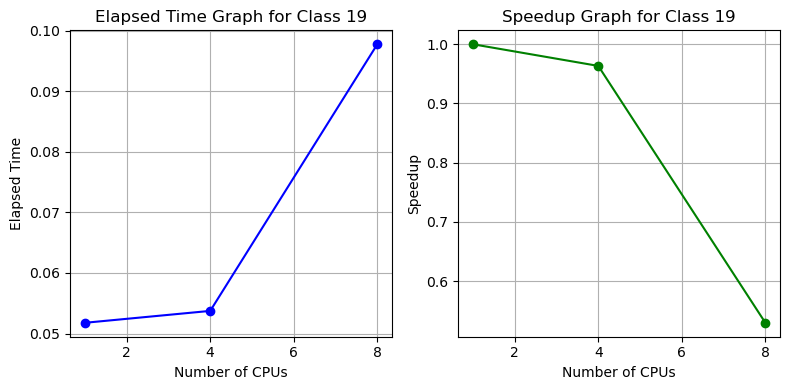

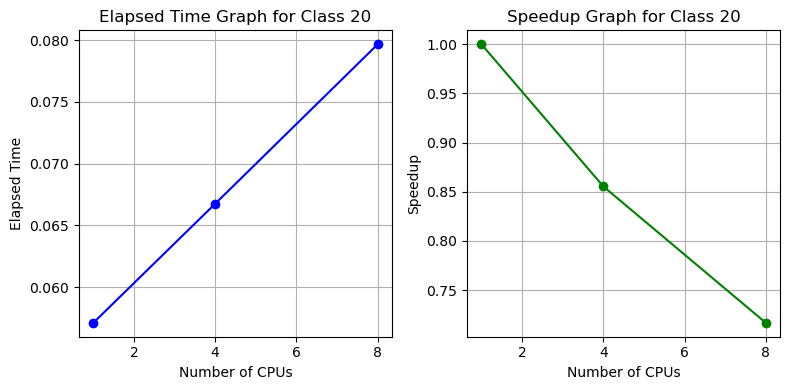

In [ ]:
plot_performance()

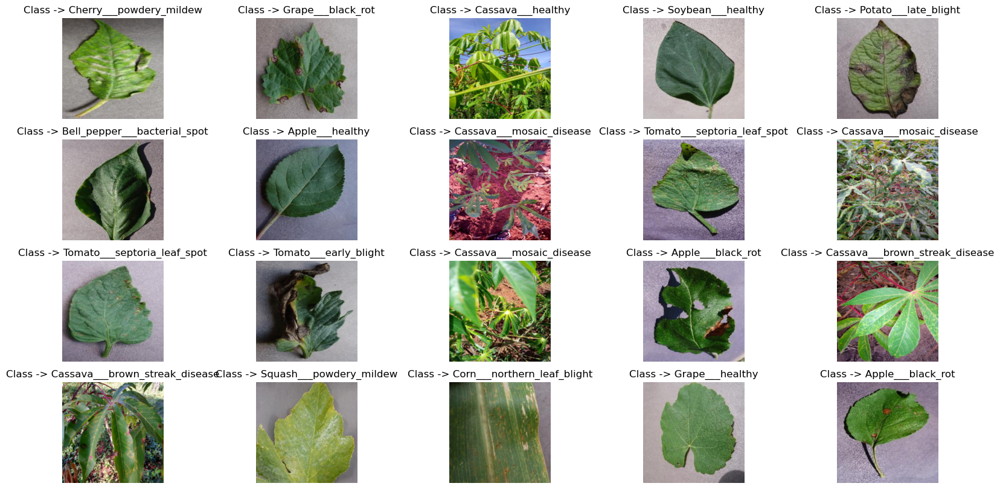

In [ ]:
visualize(validation_dataloader.dataset, 20, 4, "rgb", list(classes.keys()))

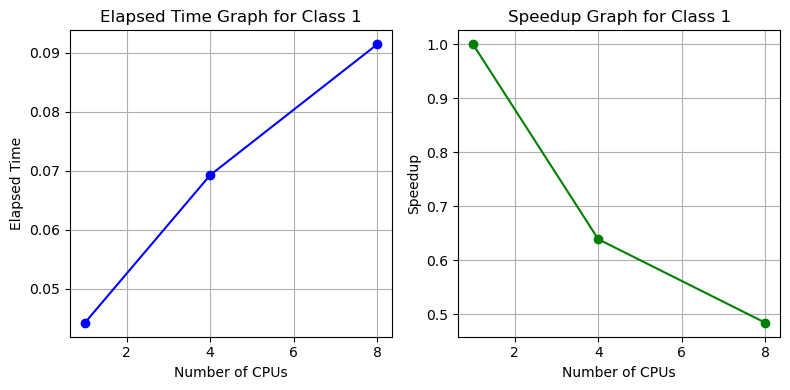

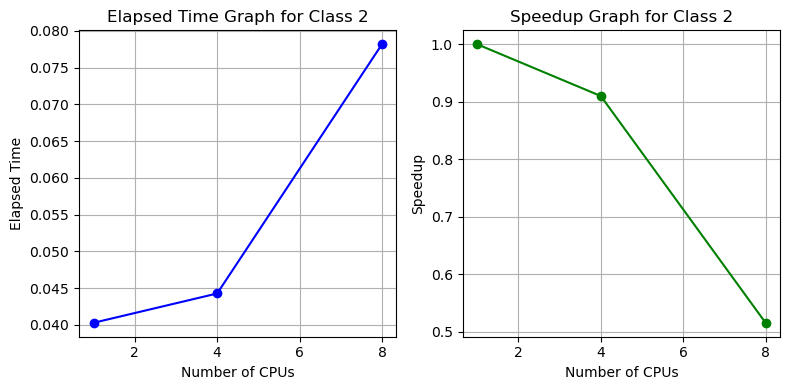

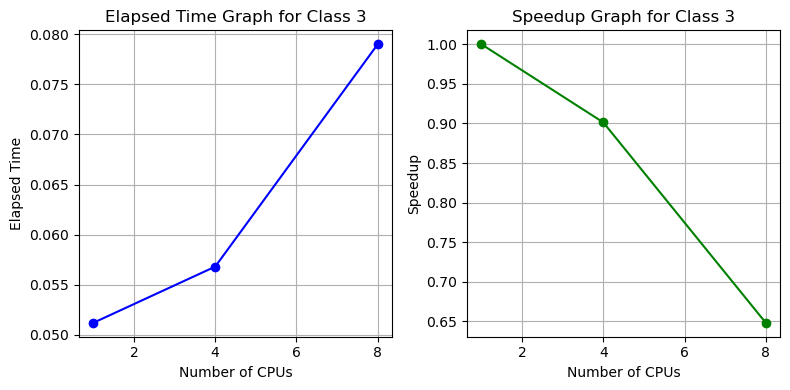

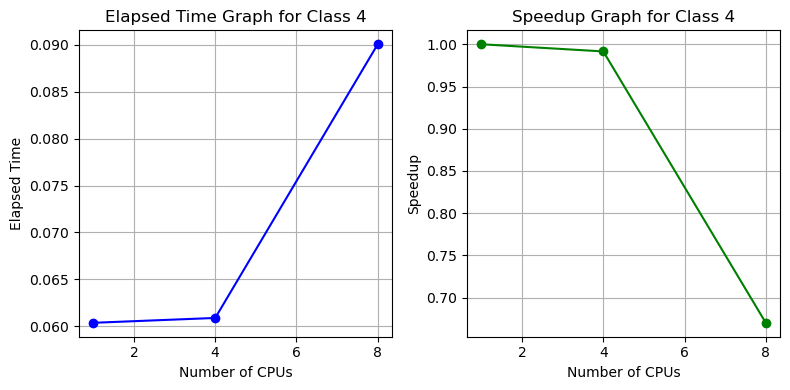

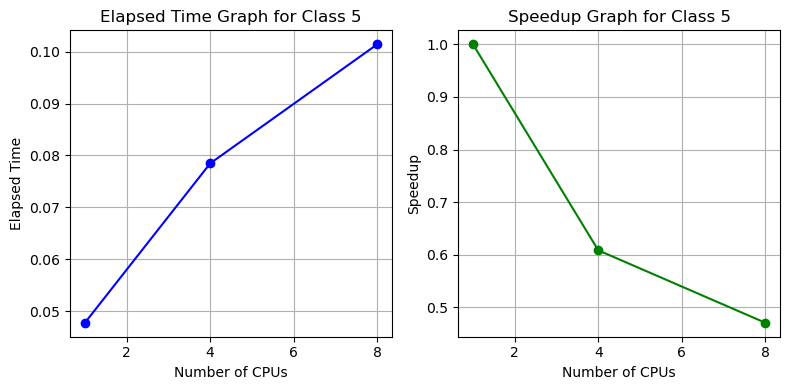

...

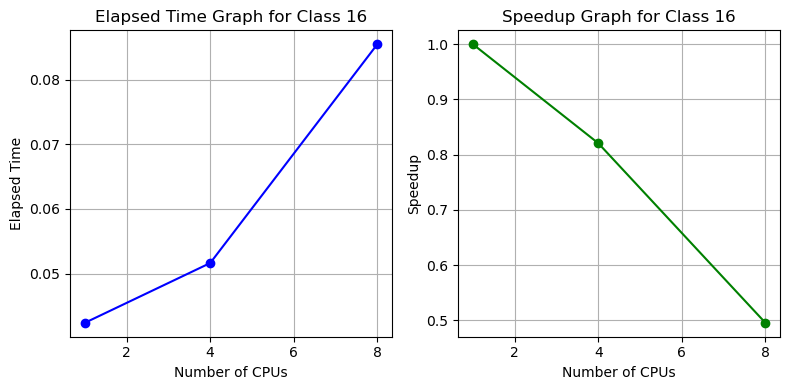

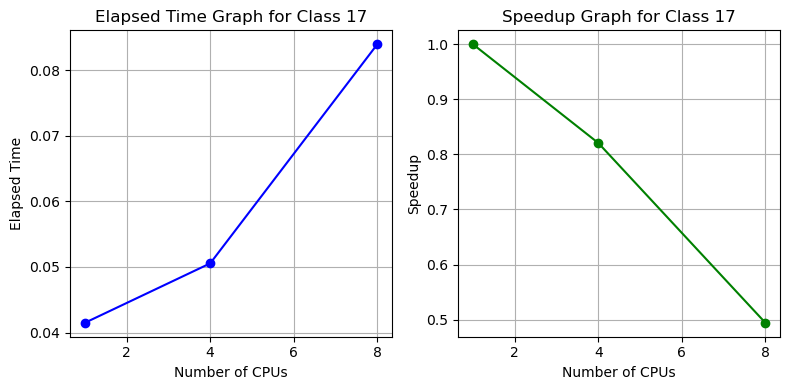

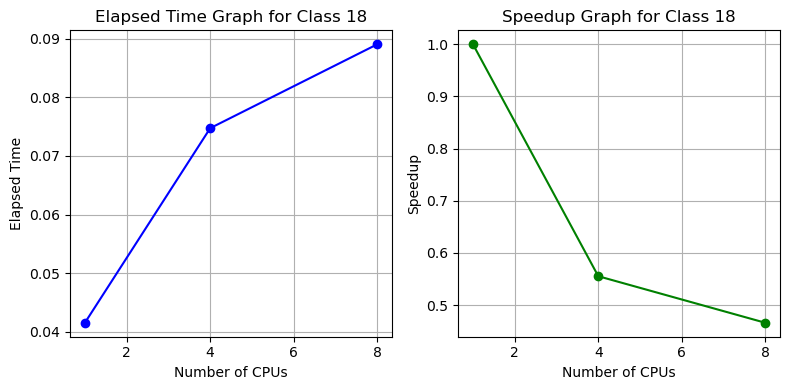

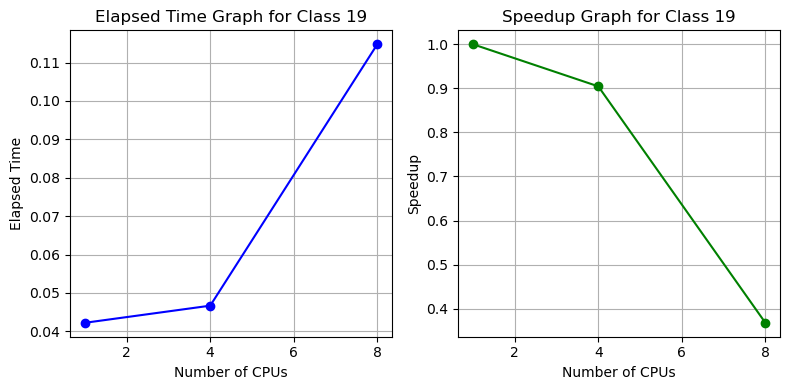

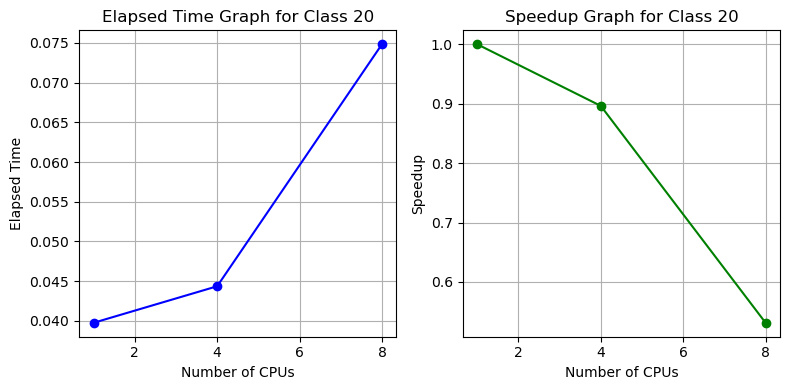

In [ ]:
plot_performance()

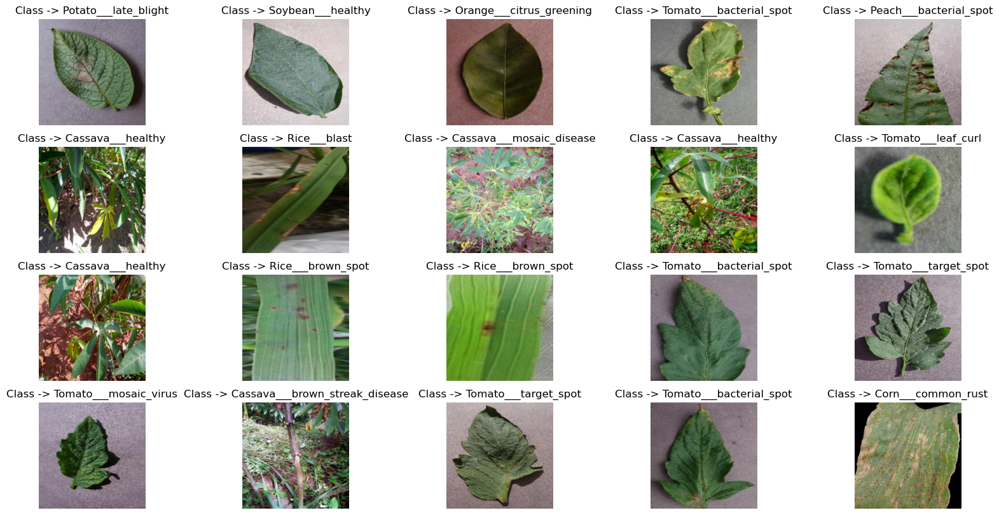

In [ ]:
visualize(test_dataloader.dataset, 20, 4, "rgb", list(classes.keys()))

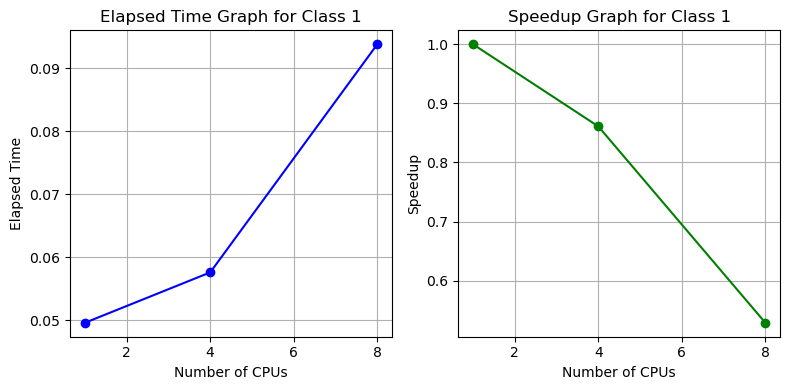

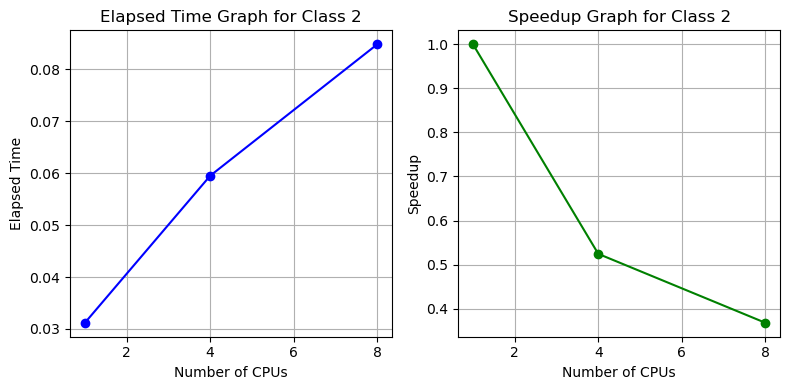

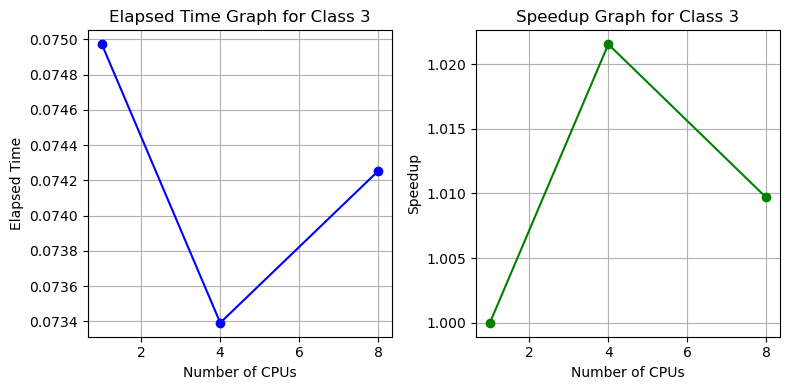

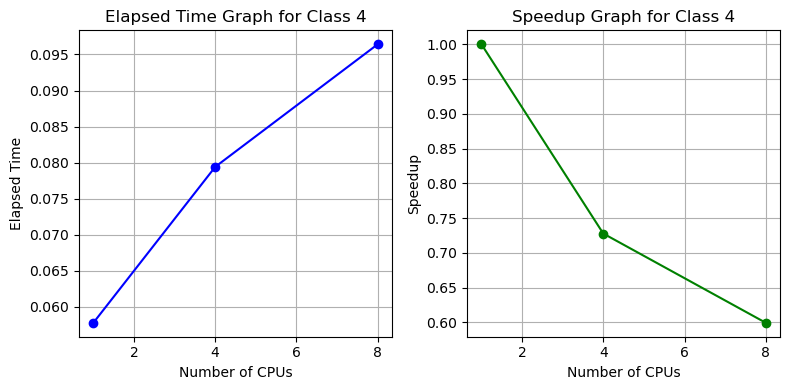

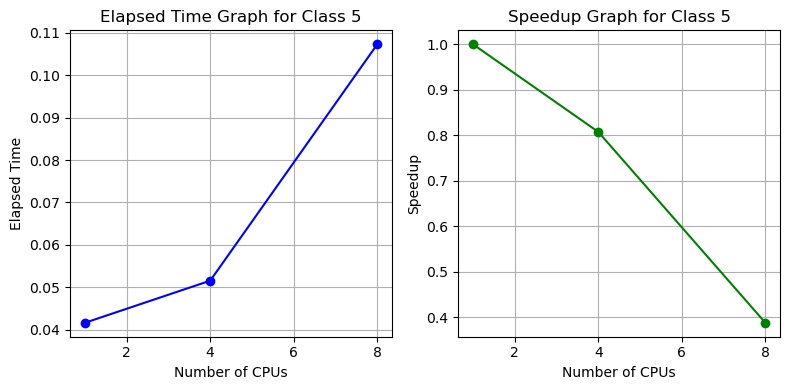

...

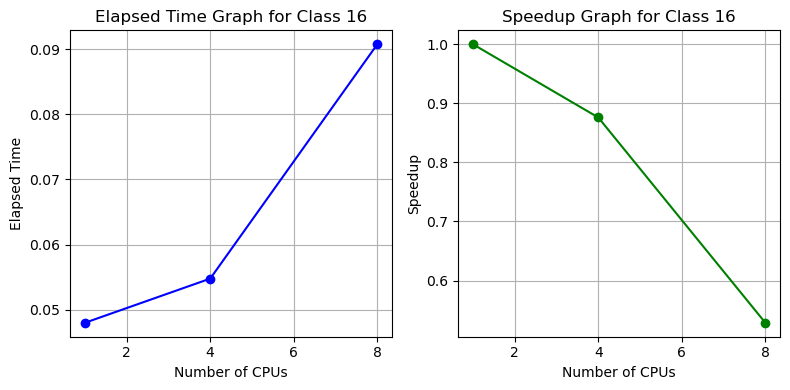

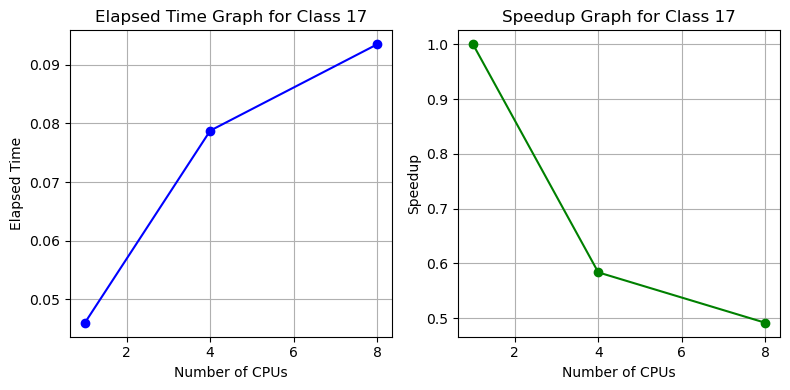

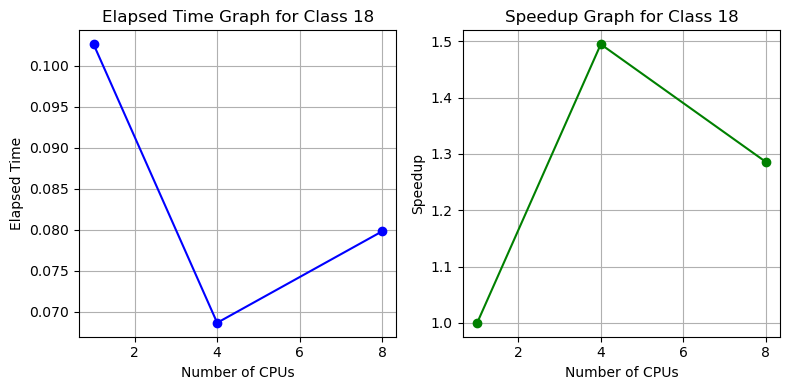

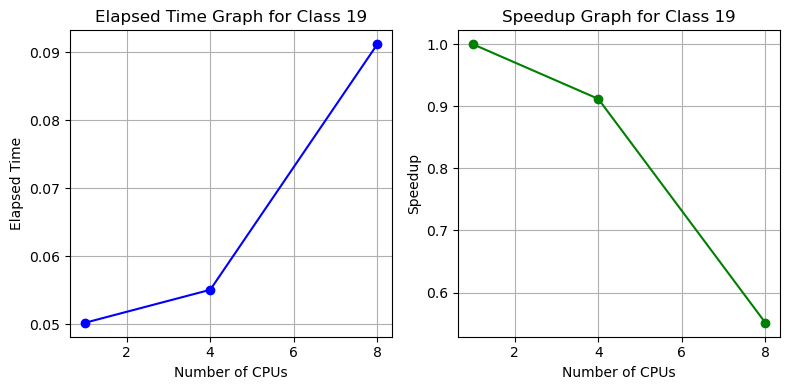

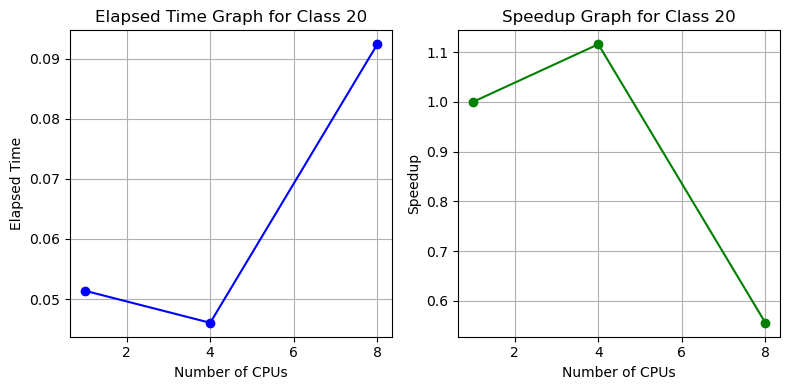

In [ ]:
plot_performance()

In [ ]:
# set batch size
batch_size = 32

In [ ]:
def show_sample_batch(data):
    for images, labels in data:
        fig, ax = plt.subplots(figsize=(30, 30))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=8).permute(1, 2, 0))
        break

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


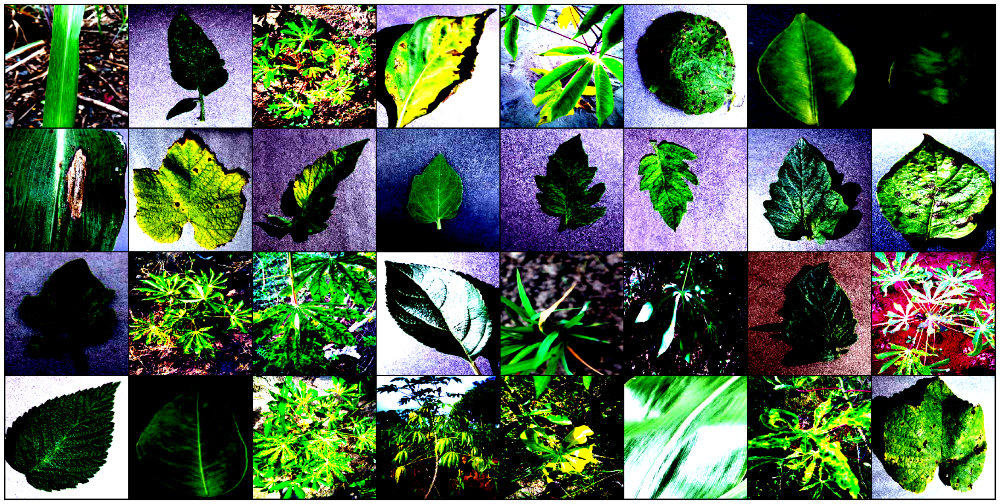

In [ ]:
show_sample_batch(train_dataloader)

In [ ]:
def get_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available:
        return torch.device("cuda")
    else:
        return torch.device("cpu")

In [ ]:
# for moving data to device (CPU or GPU)
def to_device(data, device):
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [ ]:
# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        return len(self.dl)

In [ ]:
# Move training data and validation data to GPU
device = get_device()
train_dataloader = DeviceDataLoader(train_dataloader, device)
validation_dataloader = DeviceDataLoader(validation_dataloader, device)

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=3, kernel_size=3, stride=1, padding=1)
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv2d(in_channels=3, out_channels=3, kernel_size=3, stride=1, padding=1)
        self.relu2 = nn.ReLU()

    def forward(self, x):
        out = self.conv1(x)
        out = self.relu1(out)
        out = self.conv2(out)
        return self.relu2(out) + x # ReLU can be applied before or after adding the input

In [ ]:
# Calculate the accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [ ]:
# base class for the ResNet model
class ImageClassifier(nn.Module):
    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                   # Generate prediction
        loss = F.cross_entropy(out, labels)  # Calculate loss
        acc = accuracy(out, labels)          # Calculate accuracy
        return {"val_loss": loss.detach(), "val_accuracy": acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x["val_loss"] for x in outputs]
        batch_accuracy = [x["val_accuracy"] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()       # Combine loss
        epoch_accuracy = torch.stack(batch_accuracy).mean()
        return {"val_loss": epoch_loss, "val_accuracy": epoch_accuracy} # Combine accuracies

    def epoch_end(self, epoch, result):
        print("Epoch [{}], \
              last_lr: {:.5f}, \
              train_loss: {:.4f}, \
              val_loss: {:.4f}, \
              val_acc: {:.4f}" .format(
                  epoch + 1,
                  result['lrs'][-1],
                  result['train_loss'],
                  result['val_loss'],
                  result['val_accuracy']
                )
        )

In [ ]:
# Architecture for training
# convolution block with BatchNormalization
def ConvolutionalBlock(in_channels, out_channels, pool=False):
    layers = [
        nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True)
    ]

    if pool:
        layers.append(nn.MaxPool2d(4))

    return nn.Sequential(*layers)

In [ ]:
class ResNet9(ImageClassifier):
    def __init__(self, in_channels, num_infection_classes):
        super().__init__()

        self.conv1 = ConvolutionalBlock(in_channels, 64)
        self.conv2 = ConvolutionalBlock(64, 128, pool=True)  # out_dim: 128 x 128 x 128
        self.res1 = nn.Sequential(ConvolutionalBlock(128, 128), ConvolutionalBlock(128, 128))

        self.conv3 = ConvolutionalBlock(128, 256, pool=True)  # out_dim: 256 x 64 x 64
        self.conv4 = ConvolutionalBlock(256, 512, pool=True)  # out_dim: 512 x 32 x 32
        self.res2 = nn.Sequential(ConvolutionalBlock(512, 512), ConvolutionalBlock(512, 512))

        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(512, num_infection_classes)
        )

    def forward(self, xb):  # xb is the loaded batch
        out = self.conv1(xb)
        out = self.conv2(out)
        out = self.res1(out)
        out = F.interpolate(out, scale_factor=2, mode='nearest')  # Upsample
        out = self.conv3(out)
        out = self.conv4(out)
        out = self.res2(out)
        out = F.interpolate(out, scale_factor=2, mode='nearest')  # Upsample
        out = self.classifier(out)
        return out

In [ ]:
# defining the model and moving it to the GPU
model = to_device(ResNet9(3, len(classes)), device)
model

ResNet9(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=Tr

In [ ]:
# getting summary of the model (torchsummary)
input_shape = (3, 256, 256)
print(summary(model.cuda(), (input_shape)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4        [-1, 128, 256, 256]          73,856
       BatchNorm2d-5        [-1, 128, 256, 256]             256
              ReLU-6        [-1, 128, 256, 256]               0
         MaxPool2d-7          [-1, 128, 64, 64]               0
            Conv2d-8          [-1, 128, 64, 64]         147,584
       BatchNorm2d-9          [-1, 128, 64, 64]             256
             ReLU-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 128, 64, 64]         147,584
      BatchNorm2d-12          [-1, 128, 64, 64]             256
             ReLU-13          [-1, 128, 64, 64]               0
           Conv2d-14        [-1, 256, 1

In [ ]:
# for training
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

def get_learning_rate(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

def train_model(
        epochs,
        max_lr,
        model,
        train_loader,
        val_loader,
        weight_decay = 0,
        grad_clip = None,
        opt_func = torch.optim.SGD
    ):
    torch.cuda.empty_cache()
    history = []
    optimizer = opt_func(model.parameters(), max_lr, weight_decay = weight_decay)
    _scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs = epochs, steps_per_epoch = len(train_loader))

    for epoch in range(epochs):
        # Track epoch start time
        epoch_start_time = time()

        # Train the model
        model.train()
        train_losses = []
        lrs = []
        progress_bar = tqdm(train_loader, desc = f'Epoch {epoch + 1}/{epochs}', leave = False)

        for batch in progress_bar:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()

            # Gradient clipping
            if grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)

            optimizer.step()
            optimizer.zero_grad()

            # Record and update learning rates
            lrs.append(get_learning_rate(optimizer))
            _scheduler.step()

            # Update progress bar with loss
            progress_bar.set_postfix({'loss': loss.item()})

        # Calculate epoch duration
        epoch_end_time = time()
        epoch_duration = (epoch_end_time - epoch_start_time)

        # Validate the model
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)

        # Display epoch duration in progress bar
        progress_bar.set_postfix({
            'epoch_duration': epoch_duration
        })

    model_save_path = os.path.join(os.getcwd(), "saved_models", "trained_model.pth")
    torch.save(model.state_dict(), model_save_path)

    return history

In [ ]:
%%time
history = [evaluate(model, validation_dataloader)]
history

CPU times: user 5.23 s, sys: 3.45 s, total: 8.69 s
Wall time: 11.3 s


[{'val_loss': tensor(4.1141, device='cuda:0'), 'val_accuracy': tensor(0.0179)}]

In [ ]:
epochs = 10
max_lr = 0.01
grad_clip = 0.1
weight_decay = 1e-4
opt_func = torch.optim.Adam

In [ ]:
# Initialize start time
start_time = time()

history = train_model(
    epochs,
    max_lr,
    model,
    train_dataloader,
    validation_dataloader,
    grad_clip=grad_clip,
    weight_decay=1e-4,
    opt_func=opt_func
)

# Save end time
end_time = time()

# Calculate elapsed time to minutes
training_time_seconds = end_time - start_time
training_time_minutes = training_time_seconds / 60

print(f"Overall Training Time: {training_time_seconds:.2f} seconds ({training_time_minutes:.2f} minutes)")

Epoch [1],               last_lr: 0.00280,               train_loss: 1.1506,               val_loss: 0.7083,               val_acc: 0.7706


Epoch [2],               last_lr: 0.00760,               train_loss: 0.8287,               val_loss: 1.3514,               val_acc: 0.6002


Epoch [3],               last_lr: 0.01000,               train_loss: 0.7347,               val_loss: 1.0713,               val_acc: 0.6773


Epoch [4],               last_lr: 0.00950,               train_loss: 0.6163,               val_loss: 0.8177,               val_acc: 0.7453


Epoch [5],               last_lr: 0.00812,               train_loss: 0.5390,               val_loss: 0.5742,               val_acc: 0.8071


Epoch [6],               last_lr: 0.00611,               train_loss: 0.4743,               val_loss: 0.5142,               val_acc: 0.8384


Epoch [7],               last_lr: 0.00389,               train_loss: 0.4015,               val_loss: 0.4055,               val_acc: 0.8593


Epoch [8],               last_lr: 0.00188,               train_loss: 0.3283,               val_loss: 0.2502,               val_acc: 0.9124


Epoch [9],               last_lr: 0.00050,               train_loss: 0.2596,               val_loss: 0.2213,               val_acc: 0.9185


Epoch [10],               last_lr: 0.00000,               train_loss: 0.2166,               val_loss: 0.2053,               val_acc: 0.9256
Overall Training Time: 4554.02 seconds (75.90 minutes)


In [ ]:
def plot_accuracies(history):
    accuracies = [x['val_accuracy'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs')

In [ ]:
def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x.get('val_loss').cpu() for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs')

In [ ]:
def plot_learning_rates(history):
    lrs = np.concatenate([x.get('lrs', []) for x in history])
    plt.plot(lrs)
    plt.xlabel('Batch no.')
    plt.ylabel('Learning rate')
    plt.title('Learning Rate vs. Batch no.')

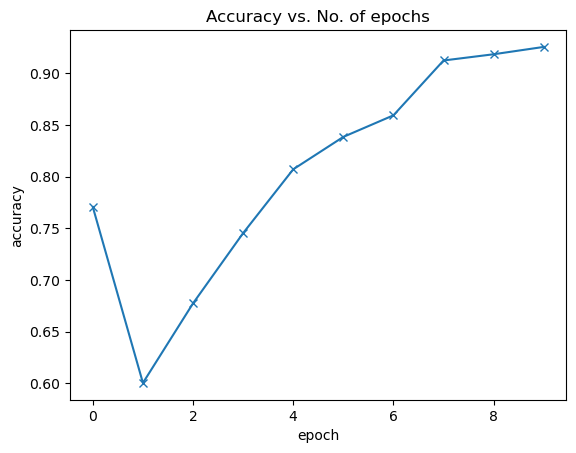

In [ ]:
plot_accuracies(history)

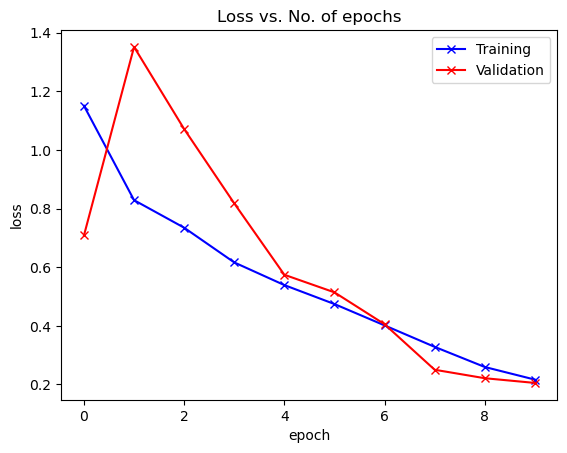

In [ ]:
plot_losses(history)

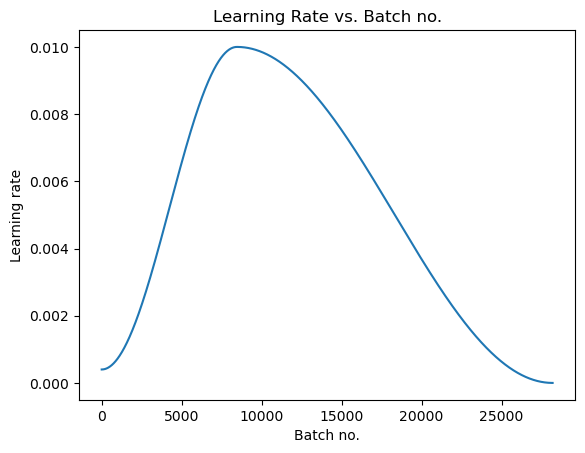

In [ ]:
plot_learning_rates(history)

In [ ]:
# Testing the model
def test_model_on_image(img, model, classes):
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Check if the predicted index exists in the classes dictionary

    prediction_index = preds[0].item()
    if prediction_index not in classes.values():
        print(f"ERROR: Unable to locate predicted class index {prediction_index} in classes dictionary!")
        return "Unknown"

    # Find the class name corresponding to the predicted index
    for _class, idx in classes.items():
        if idx == prediction_index:
            return _class

In [ ]:
# Use the function to predict classes for the test DataLoader
predicted_classes = []

for images, _ in test_dataloader:
    # Iterate over each image in the test DataLoader
    for img in images:
        # Predict the class for the image
        predicted_class = test_model_on_image(img, model, classes)
        # Append the predicted class to the list of predicted classes
        predicted_classes.append(predicted_class)

# Print the predicted classes
print(predicted_classes)

['Cassava___mosaic_disease', 'Strawberry___leaf_scorch', 'Cassava___mosaic_disease', 'Potato___healthy', 'Cassava___mosaic_disease', 'Apple___healthy', 'Cassava___healthy', 'Squash___powdery_mildew', 'Rice___tungro', 'Tomato___early_blight', 'Rice___bacterial_blight', 'Rice___brown_spot', 'Orange___citrus_greening', 'Apple___healthy', 'Tomato___mosaic_virus', 'Apple___scab', 'Apple___healthy', 'Cassava___mosaic_disease', 'Potato___early_blight', 'Tomato___bacterial_spot', 'Cassava___mosaic_disease', 'Tomato___leaf_mold', 'Tomato___bacterial_spot', 'Grape___black_measles', 'Apple___healthy', 'Rice___tungro', 'Potato___pests', 'Orange___citrus_greening', 'Cassava___mosaic_disease', 'Grape___black_measles', 'Potato___healthy', 'Raspberry___healthy', 'Grape___isariopsis_leaf_spot', 'Tomato___late_blight', 'Cassava___mosaic_disease', 'Cassava___mosaic_disease', 'Cassava___mosaic_disease', 'Potato___early_blight', 'Sugercane___healthy', 'Cassava___mosaic_disease', 'Squash___powdery_mildew', 

In [ ]:
def get_test_accuracy(model, dataloader, classes):
    accurate_predictions = 0
    total_predictions = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images = to_device(images, device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total_predictions += labels.size(0)
            accurate_predictions += (predicted == labels).sum().item()

    accuracy = accurate_predictions / total_predictions
    return accuracy

In [ ]:
# Calculate accuracy
test_accuracy = get_test_accuracy(model, test_dataloader, classes)
print(f"Accuracy on the test set: {test_accuracy:.2%}")

Accuracy on the test set: 92.42%


In [ ]:
def predict_image_class_for_single_image(image_path, model, transformations, classes):
    # Load and preprocess the external image
    image = Image.open(image_path).convert("RGB")
    if transformations is not None:
        image = transformations(image)
    image = to_device(image.unsqueeze(0), device)

    # Make predictions using the model
    with torch.no_grad():
        outputs = model(image)
        _, predicted = torch.max(outputs, 1)

    # Print the predicted index
    print("Predicted index:", predicted.item())
    predicted_index= predicted.item()

    # Get the predicted class label
    predicted_class_label = classes.get(predicted.item(), "Unknown")

    return predicted_class_label,predicted_index

In [ ]:
image_path = data_directory + "/Grape___black_rot/017268b1-c25c-4299-a566-1b7ba3f1591e___FAM_B.Rot 3014.JPG"
predicted_class_label,predicted_index = predict_image_class_for_single_image(image_path, model, tfs, classes)
print("Predicted class label:", list(classes.keys())[predicted_index])

Predicted index: 22
Predicted class label: Grape___black_rot


## Implementing Distributed Training with PyTorch's Distributed Data Parallel (DDP)

Running distributed training directly in a Jupyter Notebook is not feasible due to its single-process nature.
When we try to run the DDP implementation directly in the GPU, we get \
**RuntimeError: Cannot re-initialize CUDA in forked subprocess. To use CUDA with multiprocessing, you must use the 'spawn' start method** \
even though we set the spawn start method using
torch.set_start_method('spawn')

When we run a script in Jupyter Notebook, the code is executed in the $__main__$ module, which is a built-in module. With the fork start method (the default), the child processes inherit the parent's memory, including the train_model() function. However, with the spawn start method, each child process starts a fresh Python interpreter, and the train_model function is not available in the child process's $__main__$ module.

To overcome this issue, we create a separate Python script (ddptrainutils.py) that utilizes PyTorch's multiprocessing capabilities to spawn multiple processes, one for each GPU. This script contains our project code along with the distributed training logic, including process group initialization, data loader preparation, and model training with DistributedDataParallel.

By doing so, we effectively overcome our previous issue and successfully manage to leverage DDP across 2 GPUs and train our model.

In [ ]:
%run -i '/kaggle/usr/lib/ddptrainutils/ddptrainutils.py'

Number of available GPUs: 2
GPU 0 : Tesla T4
GPU 1 : Tesla T4
Setting up DDP on rank: 0
Setting up DDP on rank: 1
Moving model to rank: 1
Moving model to rank: 0
Moving completed on rank: 1
Starting training on rank: 1
Moving completed on rank: 0
Starting training on rank: 0


Epoch [1],           last_lr: 0.00760,           train_loss: 4.0127,           val_loss: 4.1104,           val_acc: 0.0068
Epoch [1],           last_lr: 0.00760,           train_loss: 4.0128,           val_loss: 4.1104,           val_acc: 0.0068


Epoch [2],           last_lr: 0.00950,           train_loss: 4.1105,           val_loss: 4.1104,           val_acc: 0.0056
Epoch [2],           last_lr: 0.00950,           train_loss: 4.1105,           val_loss: 4.1104,           val_acc: 0.0056


Epoch [3],           last_lr: 0.00611,           train_loss: 4.1105,           val_loss: 4.1103,           val_acc: 0.0224


Rank: 1 Epoch 4/5:   0%|          | 0/1389 [00:00<?, ?it/s]

Epoch [3],           last_lr: 0.00611,           train_loss: 4.1105,           val_loss: 4.1103,           val_acc: 0.0224


Epoch [4],           last_lr: 0.00188,           train_loss: 4.1104,           val_loss: 4.1105,           val_acc: 0.0252


Rank: 1 Epoch 5/5:   0%|          | 0/1389 [00:00<?, ?it/s]

Epoch [4],           last_lr: 0.00188,           train_loss: 4.1104,           val_loss: 4.1105,           val_acc: 0.0252


Epoch [5],           last_lr: 0.00000,           train_loss: 4.1104,           val_loss: 4.1104,           val_acc: 0.1274
Epoch [5],           last_lr: 0.00000,           train_loss: 4.1104,           val_loss: 4.1104,           val_acc: 0.1274
Overall Training Time: 3168.91 seconds (52.82 minutes)


Since our DDP implementation is executed through a Python script, the outputs are logged into separate files.

rank0_output.txt contains details such as the epoch, last learning rate, training loss, validation loss, and validation accuracy for GPU 0.
rank1_output.txt records the same metrics for GPU 1.
These files are then read to extract the data, which is used for plotting graphs and analyzing the training process.








In [ ]:
def read_data_from_file(file_name):
    data = []
    with open(file_name, 'r') as file:
        for line in file:
            parts = line.strip().split(', ')
            epoch = int(parts[0])
            last_lr = float(parts[1])
            train_loss = float(parts[2])
            val_loss = float(parts[3])
            val_acc = float(parts[4])
            entry = {
                'val_loss': val_loss,
                'val_accuracy': val_acc,
                'train_loss': train_loss,
                'lrs': [last_lr]
            }
            data.append(entry)
    return data

In [ ]:
# Reading the metrics for our DDP implementation
history0 = read_data_from_file('rank0_output.txt')
history1 = read_data_from_file('rank1_output.txt')

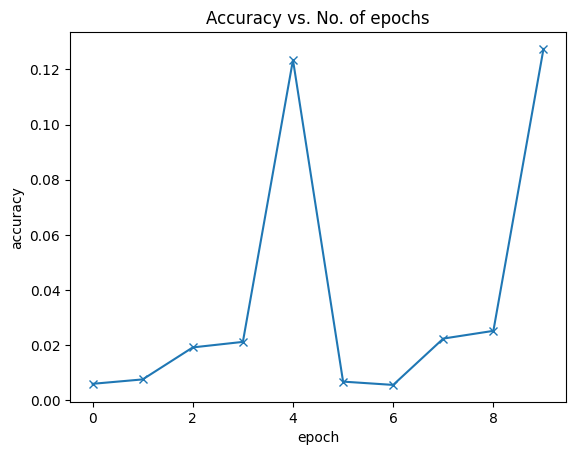

In [ ]:
plot_accuracies(history0)

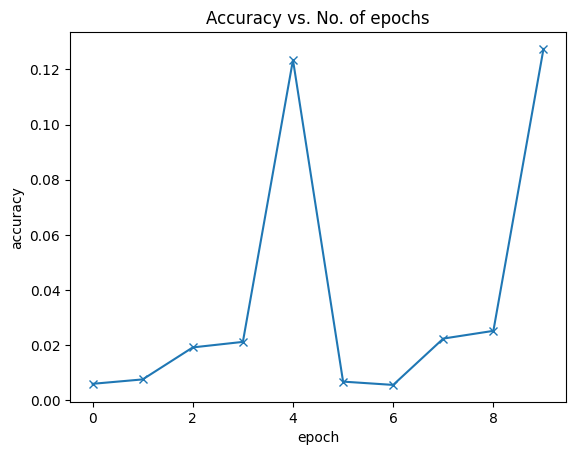

In [ ]:
# Accuracies of training on GPU 1
plot_accuracies(history1)